# File takes information about the signal and removes the first and last instuction index which is appart of instructions that isnt appart of the programs.
- Additionally, it obtains the sections that we take from the original base program to generate the update programs.
- Also, it obtains the programs to compare for the training datasets.
    - i.e. it removes the first few instructions for those that train on more prior instructions to compare later to determing if the model has reached peak fitness. 

In [1]:
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
import random
import tensorflow as tf
import numpy as np
import timeit
from sklearn import metrics
import scipy.io as sio
import csv
import os
import math 
import random as rand
from numpy import genfromtxt
from numpy import sum,isrealobj,sqrt
from numpy.random import standard_normal
import string

#import torch
#from torch import nn

import warnings
from scipy.spatial import distance


from importlib import reload
import sys
sys.path.append("../Imports/") # Adds higher directory to python modules path.

from Modules.Tools import MapTool
from Modules.Tools import BoxPlot
from Modules.Tools import Extractor
from Modules.Tools import peakCorrelation as pC
from Modules.Tools import ATmega2560_Instructions as Inst_Info

2025-01-26 14:48:57.262075: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-01-26 14:49:24.017106: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


# Notebook Parameters
- this is simply for obtaining the graphs with manual mapping. Pad is closely relate to the sampling rate for the EM signal.

In [2]:
save_folder = ""
load_signal_folder = "../Datasets/Signals/Numpy/segment_good/"
load_code_folder = "../Datasets/Instruction_Code/"
pad = 7
y_low=-2.8
y_high=2.8
amount=3200

# Load Program Code

In [3]:
Base_Benign_Code = np.load(load_code_folder + "Base_Benign.npy").tolist()
Base_Anom_Code = np.load(load_code_folder + "Base_Anom.npy").tolist()

In [4]:
Update_50_A_Benign_Code = np.load(load_code_folder + "Update_50_A_Benign.npy").tolist()
Update_50_B_Benign_Code = np.load(load_code_folder + "Update_50_B_Benign.npy").tolist()
Update_50_C_Benign_Code = np.load(load_code_folder + "Update_50_C_Benign.npy").tolist()

Update_50_A_Anom_Code = np.load(load_code_folder + "Update_50_A_Anom.npy").tolist()
Update_50_B_Anom_Code = np.load(load_code_folder + "Update_50_B_Anom.npy").tolist()
Update_50_C_Anom_Code = np.load(load_code_folder + "Update_50_C_Anom.npy").tolist()

In [5]:
Update_75_A_Benign_Code = np.load(load_code_folder + "Update_75_A_Benign.npy").tolist()
Update_75_B_Benign_Code = np.load(load_code_folder + "Update_75_B_Benign.npy").tolist()
Update_75_C_Benign_Code = np.load(load_code_folder + "Update_75_C_Benign.npy").tolist()

Update_75_A_Anom_Code = np.load(load_code_folder + "Update_75_A_Anom.npy").tolist()
Update_75_B_Anom_Code = np.load(load_code_folder + "Update_75_B_Anom.npy").tolist()
Update_75_C_Anom_Code = np.load(load_code_folder + "Update_75_C_Anom.npy").tolist()

In [6]:
Update_100_A_Benign_Code = np.load(load_code_folder + "Update_100_A_Benign.npy").tolist()
Update_100_B_Benign_Code = np.load(load_code_folder + "Update_100_B_Benign.npy").tolist()
Update_100_C_Benign_Code = np.load(load_code_folder + "Update_100_C_Benign.npy").tolist()

Update_100_A_Anom_Code = np.load(load_code_folder + "Update_100_A_Anom.npy").tolist()
Update_100_B_Anom_Code = np.load(load_code_folder + "Update_100_B_Anom.npy").tolist()
Update_100_C_Anom_Code = np.load(load_code_folder + "Update_100_C_Anom.npy").tolist()

In [7]:
Train_Program_1_Code = np.load(load_code_folder + "Train_Program_1.npy").tolist()
Train_Program_2_Code = np.load(load_code_folder + "Train_Program_2.npy").tolist()
Train_Program_3_Code = np.load(load_code_folder + "Train_Program_3.npy").tolist()
Train_Program_4_Code = np.load(load_code_folder + "Train_Program_4.npy").tolist()

# Load Signals

In [8]:
Base_Benign = np.load(load_signal_folder + "Base_Benign.npy", allow_pickle=True)
Base_Anom = np.load(load_signal_folder + "Base_Anom.npy", allow_pickle=True)

In [9]:
Update_50_A_Benign = np.load(load_signal_folder + "Update_50_A_Benign.npy", allow_pickle=True)
Update_50_B_Benign = np.load(load_signal_folder + "Update_50_B_Benign.npy", allow_pickle=True)
Update_50_C_Benign = np.load(load_signal_folder + "Update_50_C_Benign.npy", allow_pickle=True)

Update_50_A_Anom = np.load(load_signal_folder + "Update_50_A_Anom.npy", allow_pickle=True)
Update_50_B_Anom = np.load(load_signal_folder + "Update_50_B_Anom.npy", allow_pickle=True)
Update_50_C_Anom = np.load(load_signal_folder + "Update_50_C_Anom.npy", allow_pickle=True)

In [10]:
Update_75_A_Benign = np.load(load_signal_folder + "Update_75_A_Benign.npy", allow_pickle=True)
Update_75_B_Benign = np.load(load_signal_folder + "Update_75_B_Benign.npy", allow_pickle=True)
Update_75_C_Benign = np.load(load_signal_folder + "Update_75_C_Benign.npy", allow_pickle=True)

Update_75_A_Anom = np.load(load_signal_folder + "Update_75_A_Anom.npy", allow_pickle=True)
Update_75_B_Anom = np.load(load_signal_folder + "Update_75_B_Anom.npy", allow_pickle=True)
Update_75_C_Anom = np.load(load_signal_folder + "Update_75_C_Anom.npy", allow_pickle=True)

In [11]:
Update_100_A_Benign = np.load(load_signal_folder + "Update_100_A_Benign.npy", allow_pickle=True)
Update_100_B_Benign = np.load(load_signal_folder + "Update_100_B_Benign.npy", allow_pickle=True)
Update_100_C_Benign = np.load(load_signal_folder + "Update_100_C_Benign.npy", allow_pickle=True)

Update_100_A_Anom = np.load(load_signal_folder + "Update_100_A_Anom.npy", allow_pickle=True)
Update_100_B_Anom = np.load(load_signal_folder + "Update_100_B_Anom.npy", allow_pickle=True)
Update_100_C_Anom = np.load(load_signal_folder + "Update_100_C_Anom.npy", allow_pickle=True)

In [12]:
Train_Program_1 = np.load(load_signal_folder + "Train_Program_1.npy", allow_pickle=True)
Train_Program_2 = np.load(load_signal_folder + "Train_Program_2.npy", allow_pickle=True)
Train_Program_3 = np.load(load_signal_folder + "Train_Program_3.npy", allow_pickle=True)
Train_Program_4 = np.load(load_signal_folder + "Train_Program_4.npy", allow_pickle=True)

# Create a method to discect the training signal into sections.

In [13]:
Train_Program_1_Code

['inc',
 'rjmp',
 'cp',
 'brlo-t',
 'cpi',
 'brlo-f',
 'add',
 'adc',
 'sub',
 'sbc',
 'mov',
 'rjmp',
 'clr',
 'clr',
 'ldi',
 'clr',
 'ldi',
 'cp',
 'brlo-f',
 'sub',
 'inc',
 'cpi',
 'brlo-f',
 'mul',
 'mov',
 'mov',
 'mul',
 'mov',
 'clr',
 'inc',
 'clr',
 'ldi',
 'clr',
 'ldi',
 'clr',
 'clr',
 'clr',
 'mul',
 'mov',
 'rjmp',
 'ldi',
 'ldi',
 'ldi',
 'mul',
 'add',
 'adc',
 'sub',
 'sbc',
 'mov',
 'rjmp',
 'clr',
 'clr',
 'clr',
 'ldi',
 'ldi',
 'ldi',
 'mul',
 'clr',
 'clr',
 'clr',
 'clr',
 'clr',
 'mov',
 'mov',
 'add',
 'brcc-t',
 'clr',
 'clr',
 'clr',
 'mul',
 'mov',
 'rjmp',
 'clr',
 'clr',
 'clr',
 'mul',
 'mov',
 'rjmp',
 'inc',
 'clr',
 'ldi',
 'ldi',
 'ldi',
 'mul',
 'mov',
 'sub',
 'brcc-t',
 'mov',
 'rjmp',
 'ldi',
 'ldi',
 'ldi',
 'ldi',
 'clr',
 'clr',
 'clr',
 'mul',
 'mov',
 'rjmp',
 'clr',
 'clr',
 'ldi',
 'ldi',
 'ldi',
 'ldi',
 'mul',
 'clr',
 'clr',
 'mov',
 'mov',
 'add',
 'brcc-t',
 'cpi',
 'brlo-f',
 'mul',
 'mov',
 'cpi',
 'brlo-t',
 'mul',
 'mov',
 'mov',

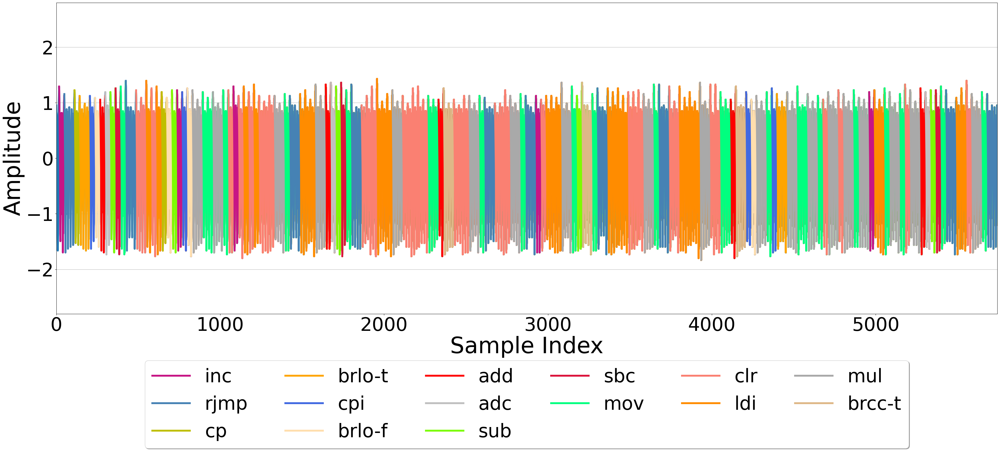

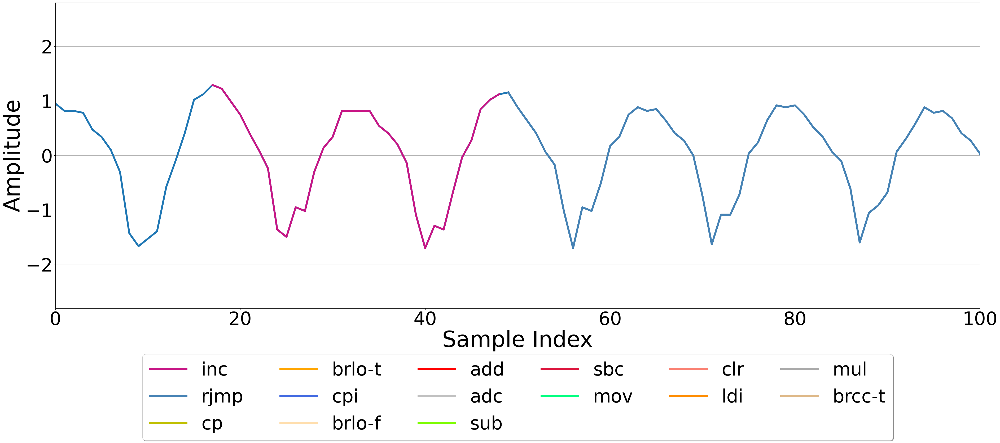

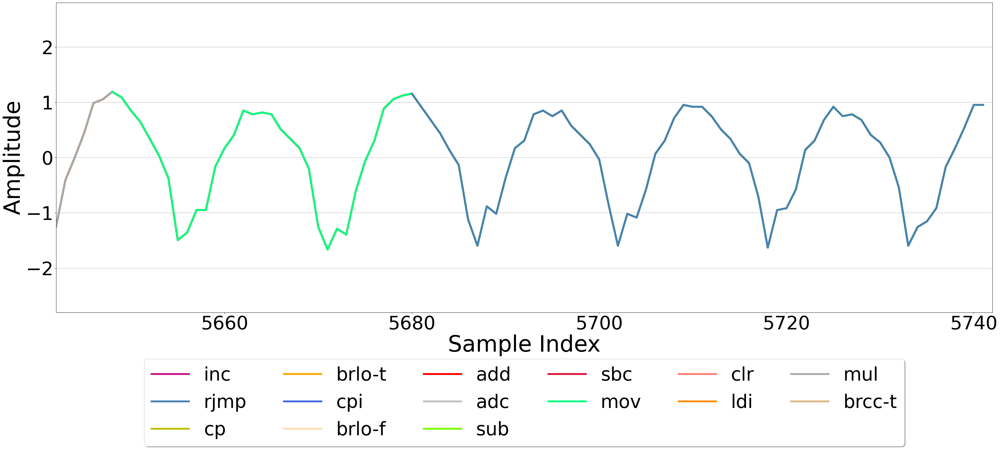

In [14]:
code = Train_Program_1_Code
Signal = Train_Program_1[0]

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=1)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

code = Train_Program_1_Code
Signal = Train_Program_1[0]

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=1)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,100])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

code = Train_Program_1_Code
Signal = Train_Program_1[0]

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=1)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([len(Signal)-100,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

In [15]:
Peaks = MapTool.getPeaksDataset(Train_Program_1, pad)

Peaks_Amount = []
for peaks in Peaks:
    Peaks_Amount.append(len(peaks))
Peaks_Amount = np.array(Peaks_Amount)

print(np.unique(Peaks_Amount))

Peaks = MapTool.getPeaksDataset(Train_Program_2, pad)

Peaks_Amount = []
for peaks in Peaks:
    Peaks_Amount.append(len(peaks))
Peaks_Amount = np.array(Peaks_Amount)

print(np.unique(Peaks_Amount))

Peaks = MapTool.getPeaksDataset(Train_Program_3, pad)

Peaks_Amount = []
for peaks in Peaks:
    Peaks_Amount.append(len(peaks))
Peaks_Amount = np.array(Peaks_Amount)

print(np.unique(Peaks_Amount))

Peaks = MapTool.getPeaksDataset(Train_Program_4, pad)

Peaks_Amount = []
for peaks in Peaks:
    Peaks_Amount.append(len(peaks))
Peaks_Amount = np.array(Peaks_Amount)

print(np.unique(Peaks_Amount))

[368]
[394]
[350]
[272]


In [16]:
Peaks = MapTool.getPeaksDataset(Train_Program_1, pad, getHigh=False)

Peaks_Amount = []
for peaks in Peaks:
    Peaks_Amount.append(len(peaks))
Peaks_Amount = np.array(Peaks_Amount)

print(np.unique(Peaks_Amount))

Peaks = MapTool.getPeaksDataset(Train_Program_2, pad, getHigh=False)

Peaks_Amount = []
for peaks in Peaks:
    Peaks_Amount.append(len(peaks))
Peaks_Amount = np.array(Peaks_Amount)

print(np.unique(Peaks_Amount))

Peaks = MapTool.getPeaksDataset(Train_Program_3, pad, getHigh=False)

Peaks_Amount = []
for peaks in Peaks:
    Peaks_Amount.append(len(peaks))
Peaks_Amount = np.array(Peaks_Amount)

print(np.unique(Peaks_Amount))

Peaks = MapTool.getPeaksDataset(Train_Program_4, pad, getHigh=False)

Peaks_Amount = []
for peaks in Peaks:
    Peaks_Amount.append(len(peaks))
Peaks_Amount = np.array(Peaks_Amount)

print(np.unique(Peaks_Amount))

[367]
[393]
[349]
[271]


In [17]:
def checkPeakAmount(dataset, dataset_2):
    Peaks = MapTool.getPeaksDataset(dataset, pad)

    Peaks_Amount = []
    for peaks in Peaks:
        Peaks_Amount.append(len(peaks))
    Peaks_Amount = np.array(Peaks_Amount)

    print("First high peaks: ", np.unique(Peaks_Amount))

    Peaks = MapTool.getPeaksDataset(dataset, pad, getHigh=False)

    Peaks_Amount = []
    for peaks in Peaks:
        Peaks_Amount.append(len(peaks))
    Peaks_Amount = np.array(Peaks_Amount)

    print("First low peaks: ", np.unique(Peaks_Amount))
    
    Peaks = MapTool.getPeaksDataset(dataset, pad)

    Peaks_Amount = []
    for peaks in Peaks:
        Peaks_Amount.append(len(peaks))
    Peaks_Amount = np.array(Peaks_Amount)

    print("Second high peaks: ", np.unique(Peaks_Amount))

    Peaks = MapTool.getPeaksDataset(dataset, pad, getHigh=False)

    Peaks_Amount = []
    for peaks in Peaks:
        Peaks_Amount.append(len(peaks))
    Peaks_Amount = np.array(Peaks_Amount)

    print("Second low peaks: ", np.unique(Peaks_Amount))

### The following discects the signals into ones that only contain only information about the program instructions
- i.e. start of the first instruction at 0 amplitude to the high point all the way to the end of hte final instruction cycle to 0.

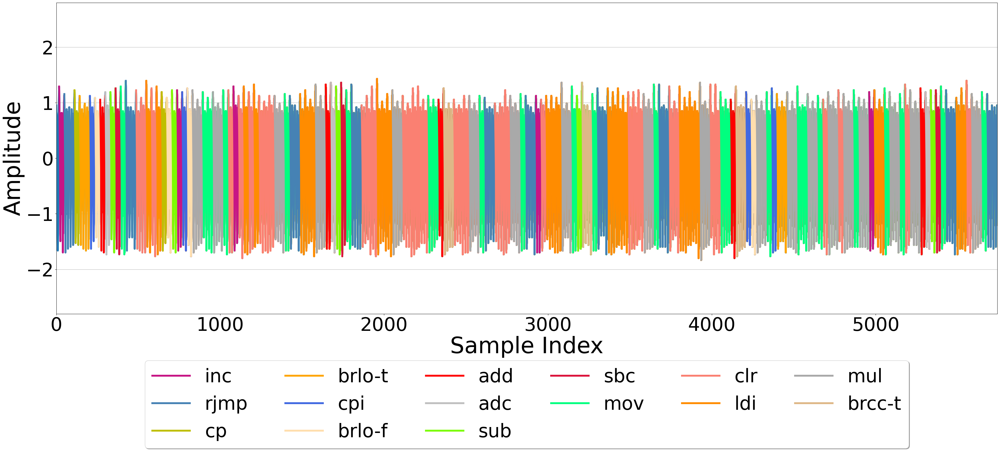

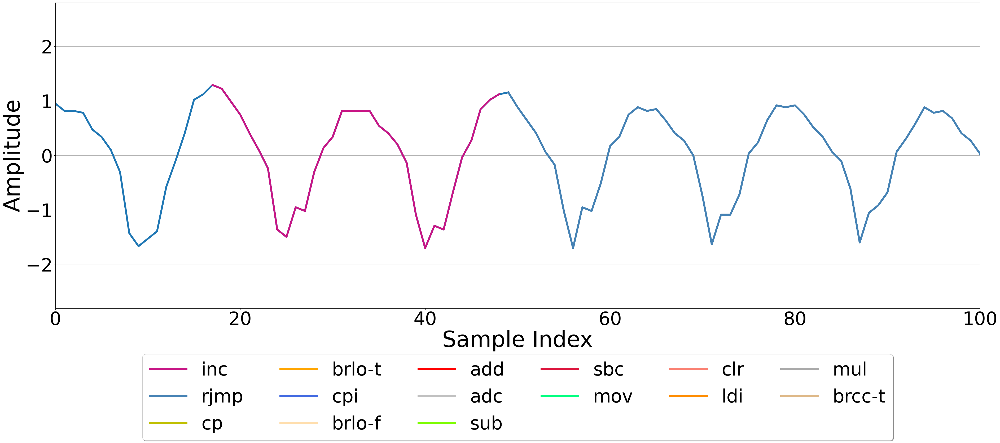

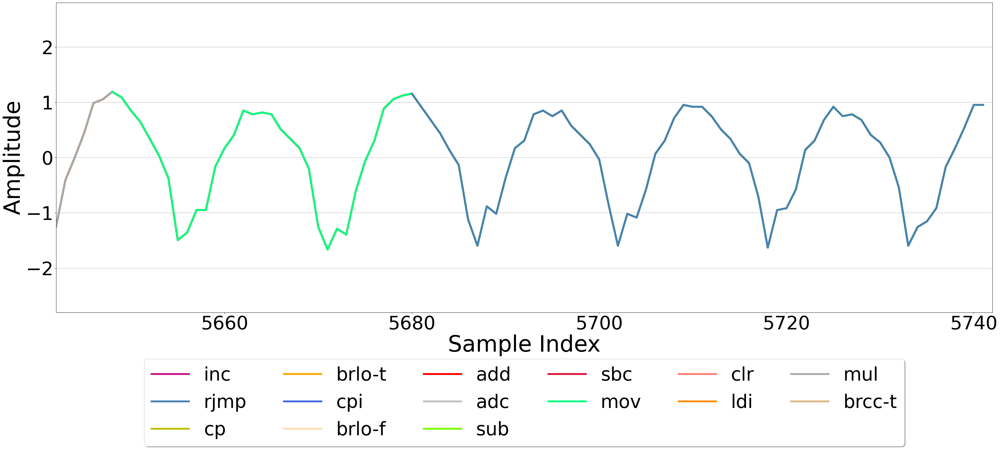

In [18]:
code = Train_Program_1_Code
Signal = Train_Program_1[0]

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=1)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

code = Train_Program_1_Code
Signal = Train_Program_1[0]

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=1)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,100])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

code = Train_Program_1_Code
Signal = Train_Program_1[0]

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=1)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([len(Signal)-100,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

In [13]:
'''
Removes the starting and end instruction infromation as these are not appart of the program under examination.
'''
def removeStartEndInstructionInfo(signal):
    stop = 0
    first_check = 0
    new_signal = signal.copy()
    
    # Since the signals start at a high peak, we need to remove to 0 and then up to when it hits 0 again.
    while stop == 0:
        if first_check == 0:
            # if above 0 remove information
            if new_signal[0] > 0:
                new_signal = new_signal[1:]
            # if below 0 remove information and a few more and set first_check to start check for below 0 amplitude.
            else: 
                new_signal = new_signal[3:]
                first_check = 1
        else:
            if new_signal[0] < 0:
                new_signal = new_signal[1:]
            else:
                stop = 1
    # next need to remove the end of the signal information of the next instruction.
    stop = 0
    while stop == 0:
        if new_signal[len(new_signal)-1] > 0:
            new_signal = new_signal[:len(new_signal)-1]
        else:
            stop = 1
            
    return new_signal
            

In [14]:
'''
Obtains a set amount of signals for comparing and performing anomaly detection later. 
Additionally, remove additional information such as the starting peak and the final peak.

input:
    dataset: numpy list of signals.
    amount: number of signals to keep.
    
output:
    new_dataset: numpy list of signals without other information
'''
def getOnlyProgram(dataset, amount):
    
    new_dataset = []
    for i in range(amount):
        signal = dataset[i]
        signal = removeStartEndInstructionInfo(signal)
        new_dataset.append(signal)
    
    return np.array(new_dataset, dtype=object)

In [22]:
Base_Benign_Complete = getOnlyProgram(Base_Benign, 2500)
Base_Anom_Complete = getOnlyProgram(Base_Anom, 2500)

Update_50_A_Benign_Complete = getOnlyProgram(Update_50_A_Benign, 2500)
Update_50_B_Benign_Complete = getOnlyProgram(Update_50_B_Benign, 2500)
Update_50_C_Benign_Complete = getOnlyProgram(Update_50_C_Benign, 2500)

Update_50_A_Anom_Complete = getOnlyProgram(Update_50_A_Anom, 2500)
Update_50_B_Anom_Complete = getOnlyProgram(Update_50_B_Anom, 2500)
Update_50_C_Anom_Complete = getOnlyProgram(Update_50_C_Anom, 2500)

Update_75_A_Benign_Complete = getOnlyProgram(Update_75_A_Benign, 2500)
Update_75_B_Benign_Complete = getOnlyProgram(Update_75_B_Benign, 2500)
Update_75_C_Benign_Complete = getOnlyProgram(Update_75_C_Benign, 2500)

Update_75_A_Anom_Complete = getOnlyProgram(Update_75_A_Anom, 2500)
Update_75_B_Anom_Complete = getOnlyProgram(Update_75_B_Anom, 2500)
Update_75_C_Anom_Complete = getOnlyProgram(Update_75_C_Anom, 2500)

Update_100_A_Benign_Complete = getOnlyProgram(Update_100_A_Benign, 2500)
Update_100_B_Benign_Complete = getOnlyProgram(Update_100_B_Benign, 2500)
Update_100_C_Benign_Complete = getOnlyProgram(Update_100_C_Benign, 2500)

Update_100_A_Anom_Complete = getOnlyProgram(Update_100_A_Anom, 2500)
Update_100_B_Anom_Complete = getOnlyProgram(Update_100_B_Anom, 2500)
Update_100_C_Anom_Complete = getOnlyProgram(Update_100_C_Anom, 2500)

Train_Program_1_Complete = getOnlyProgram(Train_Program_1, 2500)
Train_Program_2_Complete = getOnlyProgram(Train_Program_2, 2500)
Train_Program_3_Complete = getOnlyProgram(Train_Program_3, 2500)
Train_Program_4_Complete = getOnlyProgram(Train_Program_4, 2500)

In [23]:
checkPeakAmount(Train_Program_2, Train_Program_2_Complete)

First high peaks:  [394]
First low peaks:  [393]
Second high peaks:  [394]
Second low peaks:  [393]


In [24]:
save_folder = "../Datasets/Signals/Numpy/complete/"

np.save(save_folder + "Base_Benign.npy", Base_Benign_Complete)
np.save(save_folder + "Base_Anom.npy", Base_Anom_Complete)

np.save(save_folder + "Update_50_A_Benign.npy", Update_50_A_Benign_Complete)
np.save(save_folder + "Update_50_B_Benign.npy", Update_50_B_Benign_Complete)
np.save(save_folder + "Update_50_C_Benign.npy", Update_50_C_Benign_Complete)

np.save(save_folder + "Update_50_A_Anom.npy", Update_50_A_Anom_Complete)
np.save(save_folder + "Update_50_B_Anom.npy", Update_50_B_Anom_Complete)
np.save(save_folder + "Update_50_C_Anom.npy", Update_50_C_Anom_Complete)

np.save(save_folder + "Update_75_A_Benign.npy", Update_75_A_Benign_Complete)
np.save(save_folder + "Update_75_B_Benign.npy", Update_75_B_Benign_Complete)
np.save(save_folder + "Update_75_C_Benign.npy", Update_75_C_Benign_Complete)

np.save(save_folder + "Update_75_A_Anom.npy", Update_75_A_Anom_Complete)
np.save(save_folder + "Update_75_B_Anom.npy", Update_75_B_Anom_Complete)
np.save(save_folder + "Update_75_C_Anom.npy", Update_75_C_Anom_Complete)

np.save(save_folder + "Update_100_A_Benign.npy", Update_100_A_Benign_Complete)
np.save(save_folder + "Update_100_B_Benign.npy", Update_100_B_Benign_Complete)
np.save(save_folder + "Update_100_C_Benign.npy", Update_100_C_Benign_Complete)

np.save(save_folder + "Update_100_A_Anom.npy", Update_100_A_Anom_Complete)
np.save(save_folder + "Update_100_B_Anom.npy", Update_100_B_Anom_Complete)
np.save(save_folder + "Update_100_C_Anom.npy", Update_100_C_Anom_Complete)

np.save(save_folder + "Train_Program_1.npy", Train_Program_1_Complete)
np.save(save_folder + "Train_Program_2.npy", Train_Program_2_Complete)
np.save(save_folder + "Train_Program_3.npy", Train_Program_3_Complete)
np.save(save_folder + "Train_Program_4.npy", Train_Program_4_Complete)

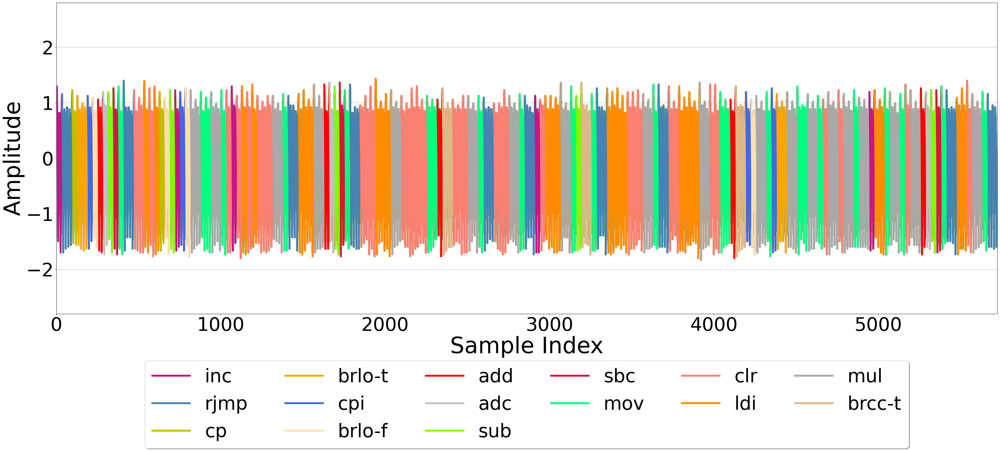

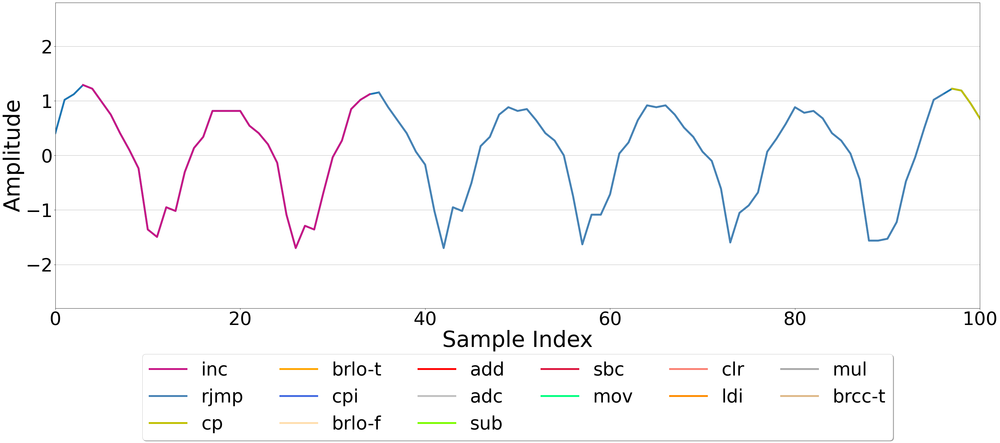

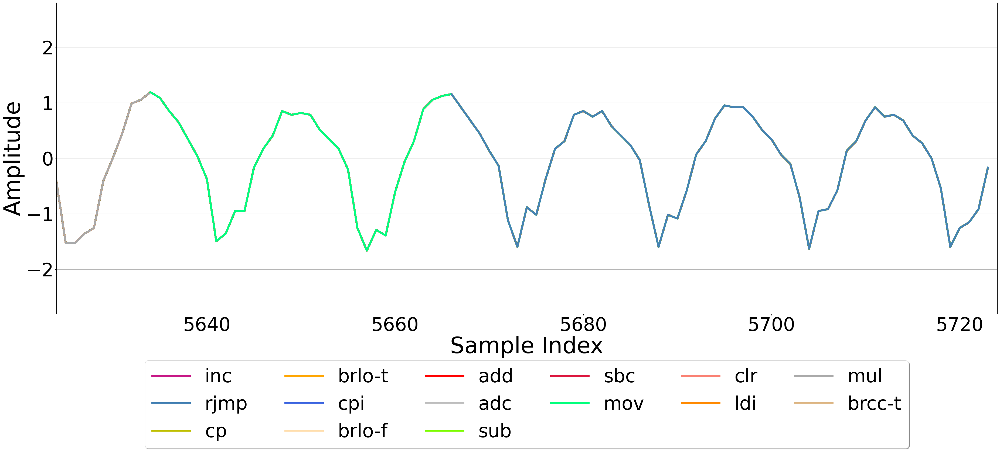

In [45]:
code = Train_Program_1_Code
Signal = Train_Program_1_Complete[0]

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,100])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([len(Signal)-100,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

# The following obtains only the sections for which to append to the generated updates to create the full updated program

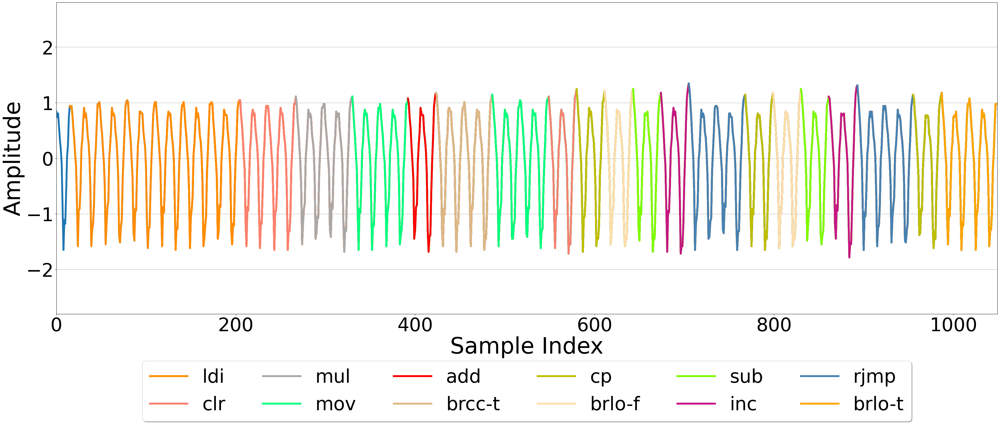

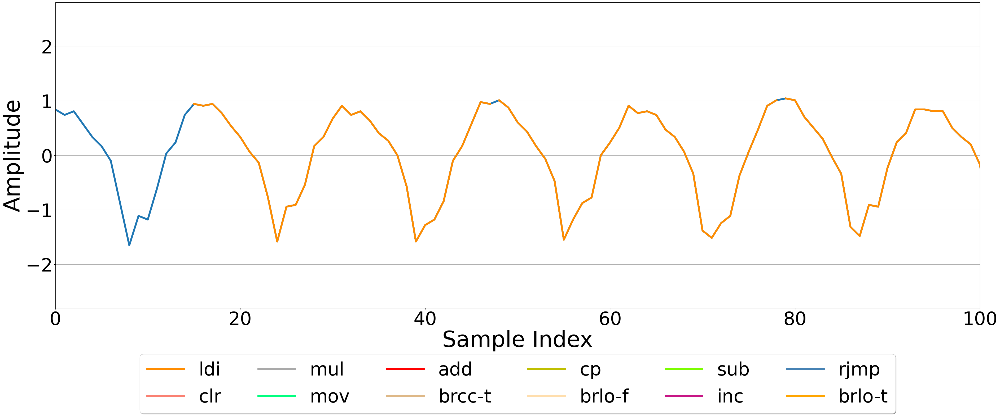

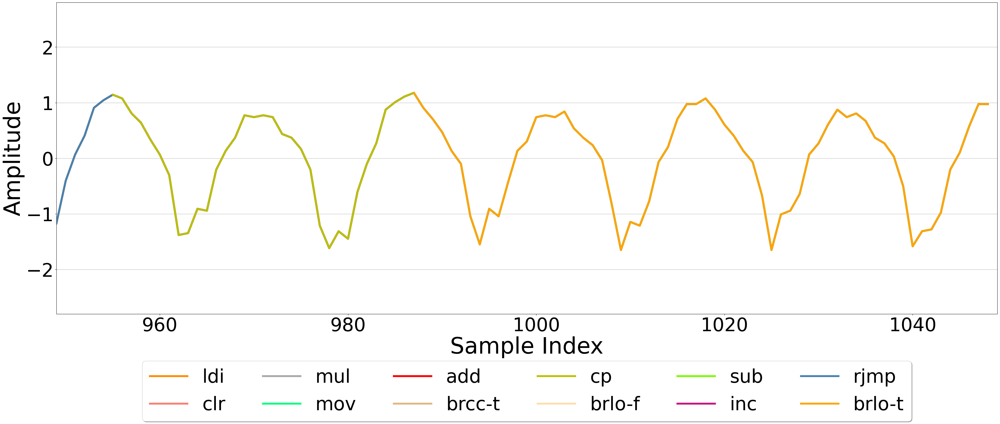

In [41]:
code = Base_Benign_Code
Signal = Base_Benign[0]

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=1)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=1)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,100])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=1)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([len(Signal)-100,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

## 50 percent

In [66]:
Base_Benign_Code_50 = Base_Benign_Code[:13]
print(Base_Benign_Code_50)

['ldi', 'ldi', 'ldi', 'ldi', 'ldi', 'ldi', 'clr', 'clr', 'mul', 'mov', 'mov', 'add', 'brcc-t']


In [67]:
Start_Update_50 = pC.getSeqSignals(Base_Benign, 0, 31, pad)
Start_Update_50 = getOnlyProgram(Start_Update_50, 2500)

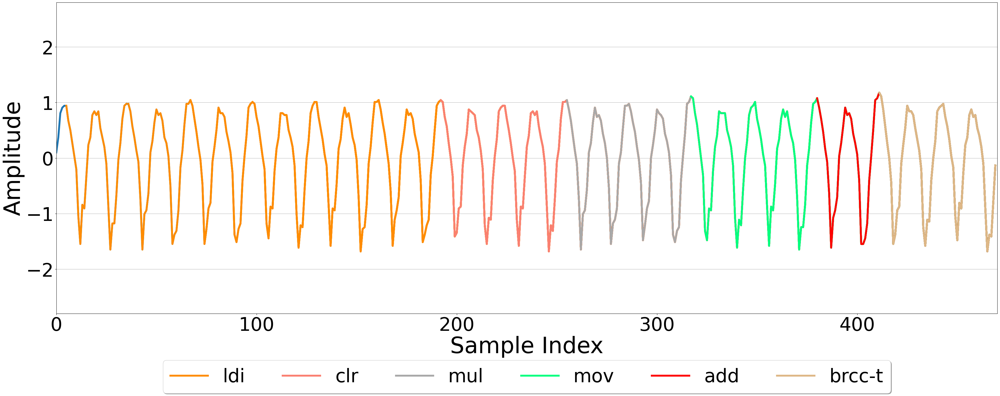

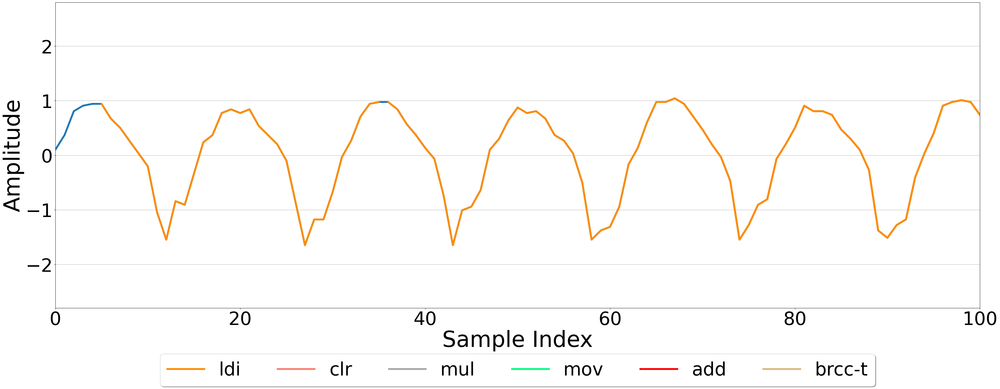

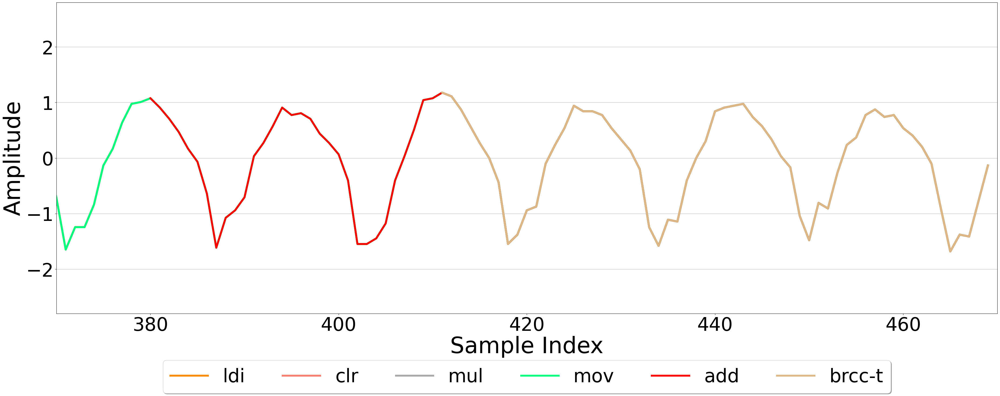

In [68]:
code = Base_Benign_Code_50
Signal = Start_Update_50[1]

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,100])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([len(Signal)-100,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

# 75 percent

In [69]:
Base_Benign_Code_75 = Base_Benign_Code[:20]
print(Base_Benign_Code_75)

['ldi', 'ldi', 'ldi', 'ldi', 'ldi', 'ldi', 'clr', 'clr', 'mul', 'mov', 'mov', 'add', 'brcc-t', 'mov', 'mov', 'clr', 'cp', 'brlo-f', 'sub', 'inc']


In [70]:
Start_Update_75 = pC.getSeqSignals(Base_Benign, 0, 45, pad)
Start_Update_75 = getOnlyProgram(Start_Update_75, 2500)

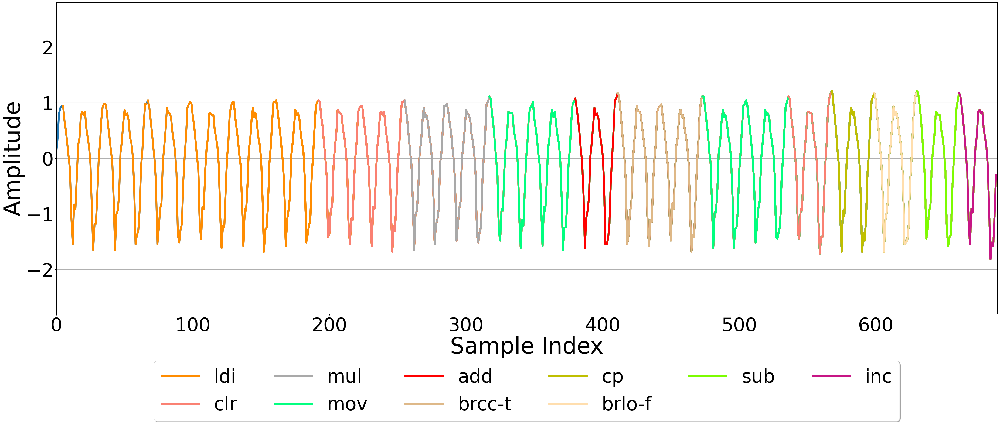

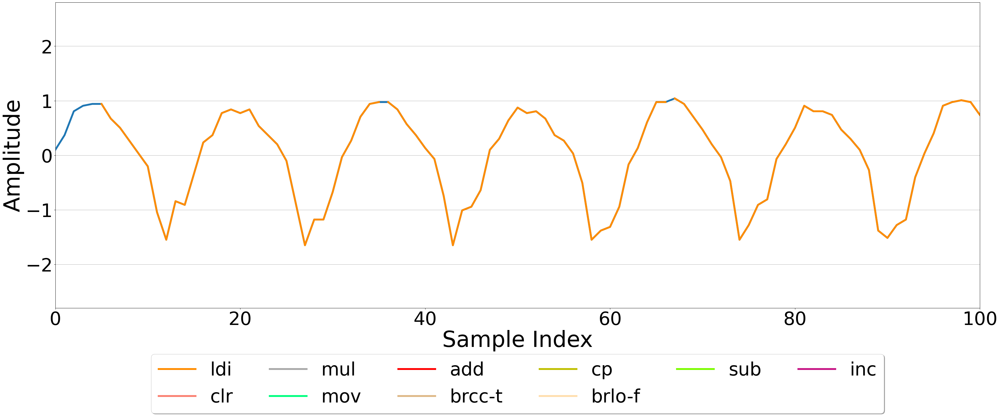

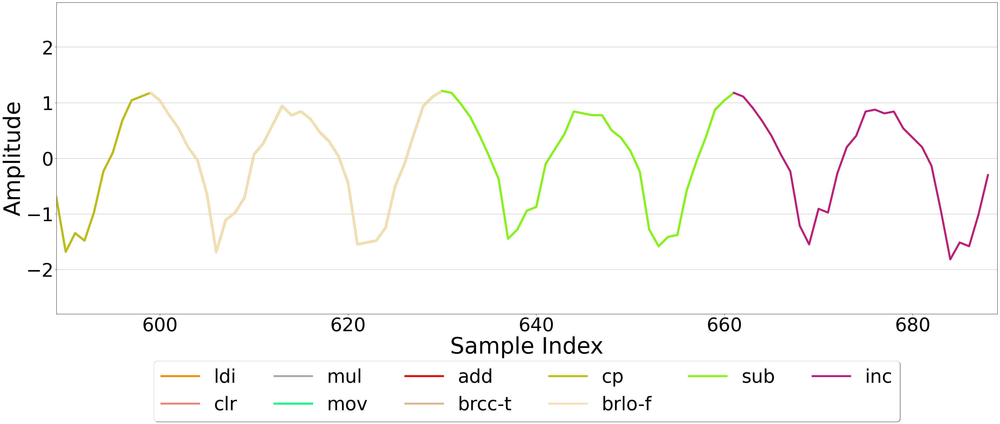

In [71]:
code = Base_Benign_Code_75
Signal = Start_Update_75[1]

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,100])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([len(Signal)-100,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

# 100 percent
- this is just the full base_benign program

In [72]:
Base_Benign_Code_100 = Base_Benign_Code
print(Base_Benign_Code_100)

['ldi', 'ldi', 'ldi', 'ldi', 'ldi', 'ldi', 'clr', 'clr', 'mul', 'mov', 'mov', 'add', 'brcc-t', 'mov', 'mov', 'clr', 'cp', 'brlo-f', 'sub', 'inc', 'rjmp', 'cp', 'brlo-f', 'sub', 'inc', 'rjmp', 'cp', 'brlo-t']


In [73]:
Start_Update_100 = getOnlyProgram(Base_Benign, 2500)

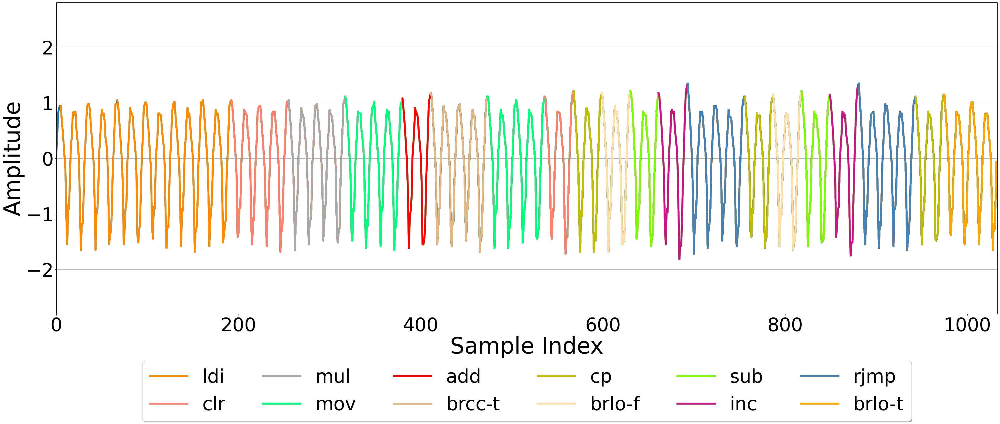

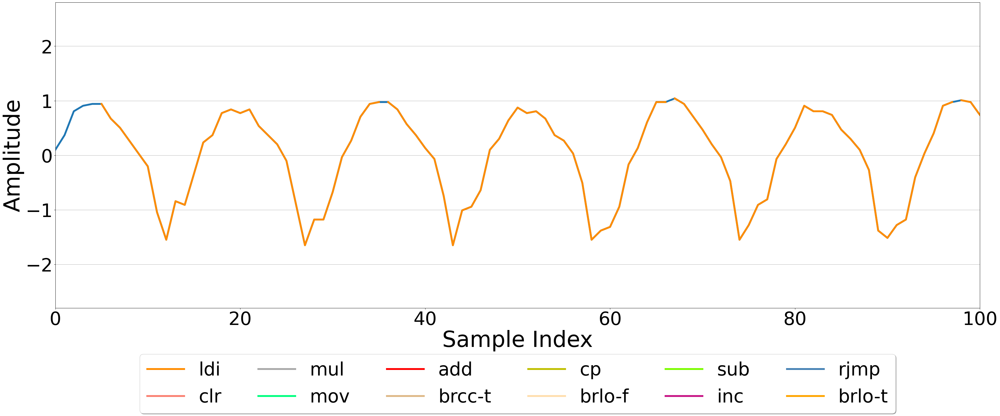

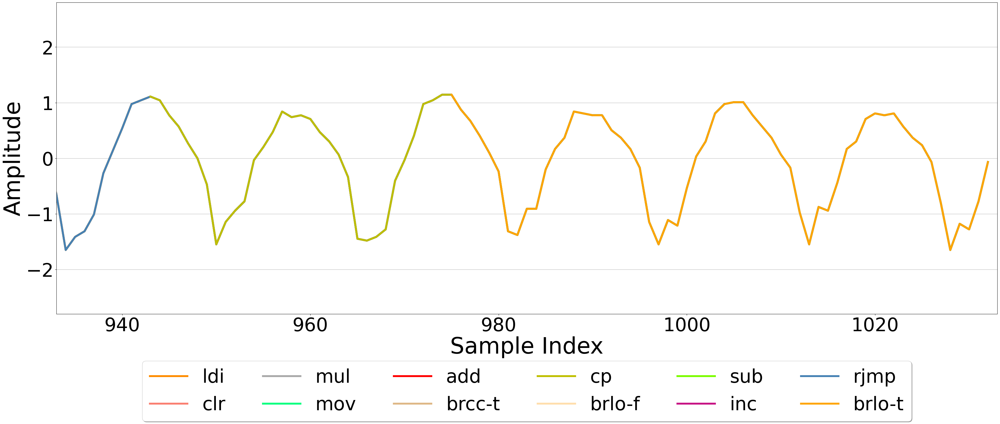

In [74]:
code = Base_Benign_Code_100
Signal = Start_Update_100[1]

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,100])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([len(Signal)-100,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

In [75]:
save_folder = "../Datasets/Signals/Numpy/complete/"

np.save(save_folder + "Start_Update_50.npy", Start_Update_50)
np.save(save_folder + "Start_Update_75.npy", Start_Update_75)
np.save(save_folder + "Start_Update_100.npy", Start_Update_100)

# The following is for comparing generating the training sets when the instance generates considering prior instructions, I.E. we remove some of the first few instructions from the training programs signals.

In [1]:
save_folder = "../Datasets/Signals/Numpy/complete/"

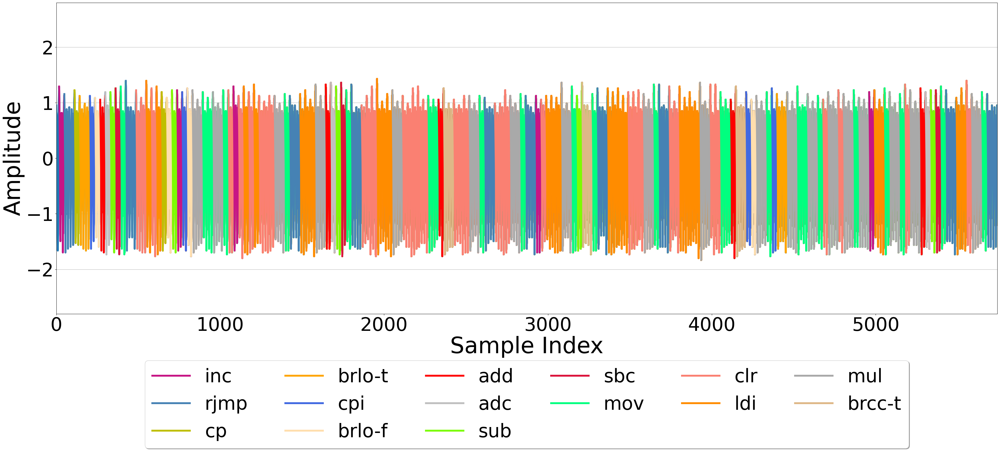

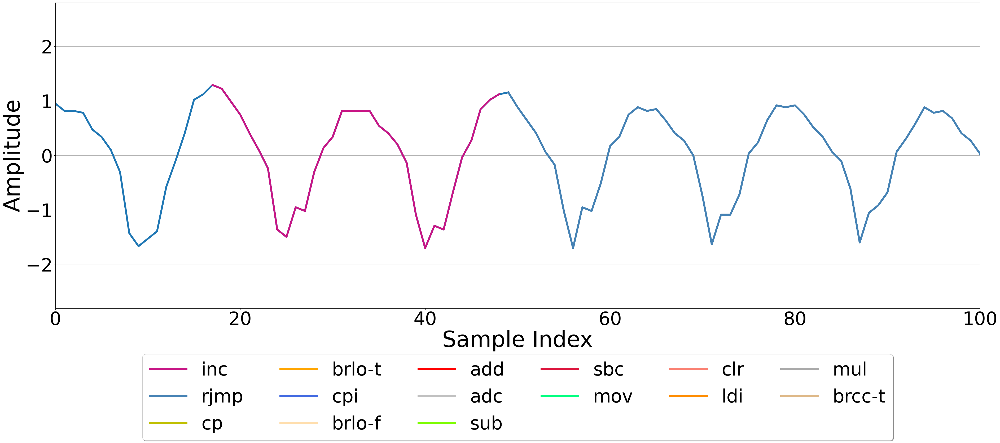

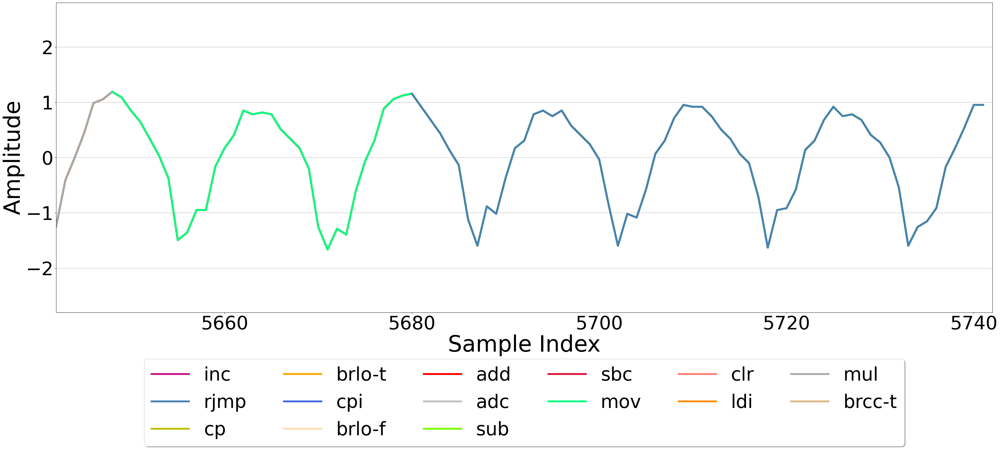

In [76]:
code = Train_Program_1_Code
Signal = Train_Program_1[0]

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=1)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=1)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,100])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=1)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([len(Signal)-100,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

In [15]:
def getNewCodeandSignalsMinusStartInst(dataset, code, inst_Remove):
    new_code = code.copy()
    start = 0
    for i in range(inst_Remove):
        amount_Cycles = Inst_Info.getCycles(new_code[0])
        start = start + (amount_Cycles * 2)
        new_code = new_code[1:]
    new_dataset = pC.getSeqSignals(dataset, start, 5000, pad)
    new_dataset = getOnlyProgram(new_dataset, 2500)
    
    return new_code, new_dataset

In [108]:
Train_Program_2_Code_prior_1, Train_Program_2_prior_1 = getNewCodeandSignalsMinusStartInst(Train_Program_1, 
                                                                                           Train_Program_1_Code, 
                                                                                           2)

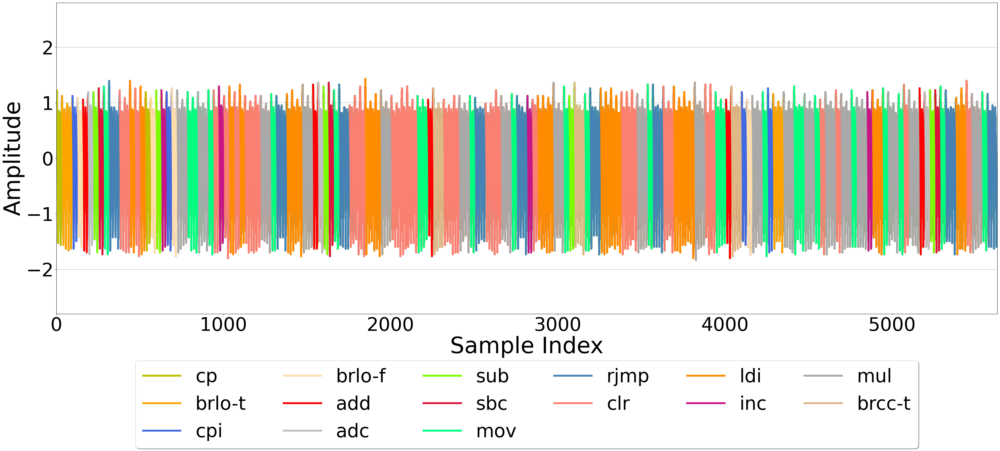

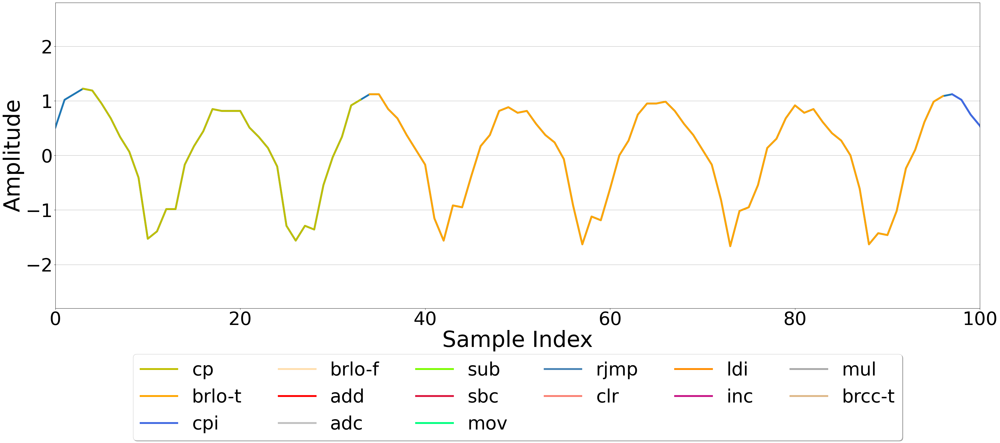

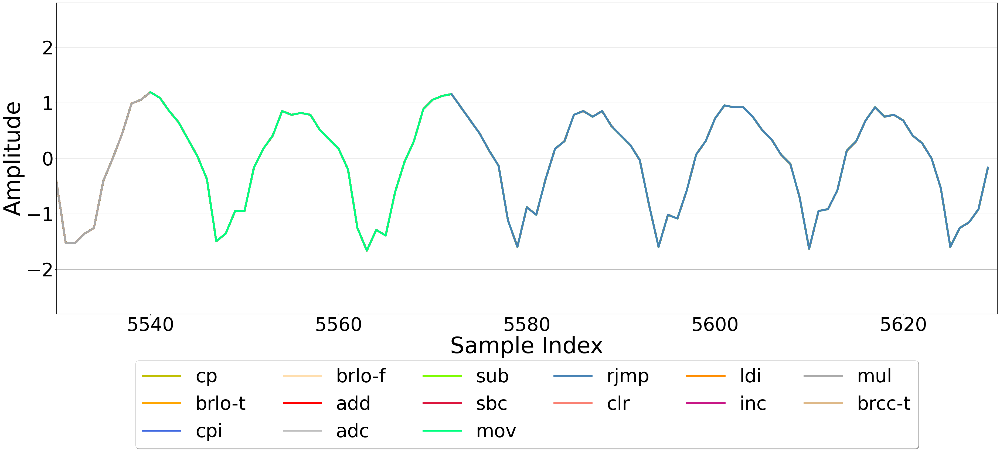

In [110]:
code = Train_Program_2_Code_prior_1
Signal = Train_Program_2_prior_1[0]

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([0,100])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

time_Signal = np.arange(Signal.shape[0])
plt.plot(time_Signal, Signal)
MapTool.mapCodeSignal(Signal, code, pad,skip_start_peaks=0)
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.grid(axis='y')

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.12),
          fancybox=True, shadow=True, ncol=6)
plt.xlim([len(Signal)-100,len(Signal)])
plt.ylim(y_low,y_high)
plt.show()
plt.close()

In [16]:
Train_Program_1_Code_prior_0, Train_Program_1_prior_0 = getNewCodeandSignalsMinusStartInst(Train_Program_1, 
                                                                                           Train_Program_1_Code, 
                                                                                        0)

In [17]:
Train_Program_2_Code_prior_0, Train_Program_2_prior_0 = getNewCodeandSignalsMinusStartInst(Train_Program_2, 
                                                                                           Train_Program_2_Code, 
                                                                                           0)

In [18]:
Train_Program_3_Code_prior_0, Train_Program_3_prior_0 = getNewCodeandSignalsMinusStartInst(Train_Program_3, 
                                                                                           Train_Program_3_Code, 
                                                                                           0)

In [19]:
Train_Program_4_Code_prior_0, Train_Program_4_prior_0 = getNewCodeandSignalsMinusStartInst(Train_Program_4, 
                                                                                           Train_Program_4_Code, 
                                                                                           0)

In [20]:
np.save(save_folder + "Train_Program_1_prior_0.npy", Train_Program_1_prior_0)
np.save(save_folder + "Train_Program_2_prior_0.npy", Train_Program_2_prior_0)
np.save(save_folder + "Train_Program_3_prior_0.npy", Train_Program_3_prior_0)
np.save(save_folder + "Train_Program_4_prior_0.npy", Train_Program_4_prior_0)

In [111]:
Train_Program_1_Code_prior_1, Train_Program_1_prior_1 = getNewCodeandSignalsMinusStartInst(Train_Program_1, 
                                                                                           Train_Program_1_Code, 
                                                                                           1)

In [112]:
Train_Program_2_Code_prior_1, Train_Program_2_prior_1 = getNewCodeandSignalsMinusStartInst(Train_Program_2, 
                                                                                           Train_Program_2_Code, 
                                                                                           1)

In [113]:
Train_Program_3_Code_prior_1, Train_Program_3_prior_1 = getNewCodeandSignalsMinusStartInst(Train_Program_3, 
                                                                                           Train_Program_3_Code, 
                                                                                           1)

In [114]:
Train_Program_4_Code_prior_1, Train_Program_4_prior_1 = getNewCodeandSignalsMinusStartInst(Train_Program_4, 
                                                                                           Train_Program_4_Code, 
                                                                                           1)

In [115]:
np.save(save_folder + "Train_Program_1_prior_1.npy", Train_Program_1_prior_1)
np.save(save_folder + "Train_Program_2_prior_1.npy", Train_Program_2_prior_1)
np.save(save_folder + "Train_Program_3_prior_1.npy", Train_Program_3_prior_1)
np.save(save_folder + "Train_Program_4_prior_1.npy", Train_Program_4_prior_1)

In [116]:
Train_Program_1_Code_prior_2, Train_Program_1_prior_2 = getNewCodeandSignalsMinusStartInst(Train_Program_1, 
                                                                                           Train_Program_1_Code, 
                                                                                           2)

In [117]:
Train_Program_2_Code_prior_2, Train_Program_2_prior_2 = getNewCodeandSignalsMinusStartInst(Train_Program_2, 
                                                                                           Train_Program_2_Code, 
                                                                                           2)

In [118]:
Train_Program_3_Code_prior_2, Train_Program_3_prior_2 = getNewCodeandSignalsMinusStartInst(Train_Program_3, 
                                                                                           Train_Program_3_Code, 
                                                                                           2)

In [119]:
Train_Program_4_Code_prior_2, Train_Program_4_prior_2 = getNewCodeandSignalsMinusStartInst(Train_Program_4, 
                                                                                           Train_Program_4_Code, 
                                                                                           2)

In [120]:
np.save(save_folder + "Train_Program_1_prior_2.npy", Train_Program_1_prior_2)
np.save(save_folder + "Train_Program_2_prior_2.npy", Train_Program_2_prior_2)
np.save(save_folder + "Train_Program_3_prior_2.npy", Train_Program_3_prior_2)
np.save(save_folder + "Train_Program_4_prior_2.npy", Train_Program_4_prior_2)

In [21]:
Train_Program_1_Code_prior_3, Train_Program_1_prior_3 = getNewCodeandSignalsMinusStartInst(Train_Program_1, 
                                                                                           Train_Program_1_Code, 
                                                                                           3)

In [22]:
Train_Program_2_Code_prior_3, Train_Program_2_prior_3 = getNewCodeandSignalsMinusStartInst(Train_Program_2, 
                                                                                           Train_Program_2_Code, 
                                                                                           3)

In [23]:
Train_Program_3_Code_prior_3, Train_Program_3_prior_3 = getNewCodeandSignalsMinusStartInst(Train_Program_3, 
                                                                                           Train_Program_3_Code, 
                                                                                           3)

In [24]:
Train_Program_4_Code_prior_3, Train_Program_4_prior_3 = getNewCodeandSignalsMinusStartInst(Train_Program_4, 
                                                                                           Train_Program_4_Code, 
                                                                                           3)

In [25]:
np.save(save_folder + "Train_Program_1_prior_3.npy", Train_Program_1_prior_3)
np.save(save_folder + "Train_Program_2_prior_3.npy", Train_Program_2_prior_3)
np.save(save_folder + "Train_Program_3_prior_3.npy", Train_Program_3_prior_3)
np.save(save_folder + "Train_Program_4_prior_3.npy", Train_Program_4_prior_3)